# LSTM Prediction

## Dataset

https://archive.ics.uci.edu/dataset/1175/pgcb+hourly+generation+dataset+(bangladesh)

This dataset, published by the Power Grid Company of Bangladesh (PGCB), provides hourly records of electricity generation, demand, and loadshedding across the national grid. It includes breakdowns by generation source, enabling advanced analysis of grid operations, forecasting, and generation mix optimization. PGCB is the sole national transmission operator in Bangladesh, overseeing a complex mixed-technology power grid. With an installed capacity of ~25,700 MW and full transmission coverage, it plays a key role in ensuring grid stability and managing system reliability.

## Import

In [1]:
# ============================================================================
# BLOCK 1: IMPORTS
# ============================================================================
import sys
import os
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.regularizers import l2

# my custom libraries path
MY_LIB_PATH = r"/home/seba/Documentos/Data Science Projects/seba-libs"
sys.path.append(MY_LIB_PATH)

from exploratory_data_analysis import ExploratoryDataAnalysis
from model_preparation import ModelPreparation

print("✓ All libraries imported successfully")

2025-12-23 20:43:16.143909: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-23 20:43:16.168383: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


✓ All libraries imported successfully


2025-12-23 20:43:16.770248: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [2]:
import pandas as pd

# Cargar el Excel
df = pd.read_excel("datasets/PGCB_date_power_demand.xlsx")

# Ver las primeras filas
df.head()


,datetime,generation_mw,demand_mw,load_shedding,gas,liquid_fuel,coal,hydro,solar,wind,india_bheramara_hvdc,india_tripura,india_adani,nepal,remarks
0,2015-04-19 22:00:00,6323.0,6323,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN
1,2015-04-19 21:00:00,6667.0,6667,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN
2,2015-04-19 19:00:00,6897.0,6897,0,4415,1836,161,41,NaN,NaN,444,0,NaN,NaN,NaN
3,2015-04-19 18:30:00,6933.0,6933,0,4423,1862,159,45,NaN,NaN,444,0,NaN,NaN,Evening_Peak
4,2015-04-19 18:00:00,6874.0,6874,0,4319,1892,155,65,NaN,NaN,443,0,NaN,NaN,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92650 entries, 0 to 92649
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   datetime              92650 non-null  datetime64[ns]
 1   generation_mw         92650 non-null  float64       
 2   demand_mw             92650 non-null  int64         
 3   load_shedding         92650 non-null  int64         
 4   gas                   92650 non-null  int64         
 5   liquid_fuel           92650 non-null  int64         
 6   coal                  92650 non-null  int64         
 7   hydro                 92650 non-null  int64         
 8   solar                 70517 non-null  float64       
 9   wind                  18676 non-null  float64       
 10  india_bheramara_hvdc  92650 non-null  int64         
 11  india_tripura         92650 non-null  int64         
 12  india_adani           7338 non-null   float64       
 13  nepal           

In [4]:
df.describe()

,datetime,generation_mw,demand_mw,load_shedding,gas,liquid_fuel,coal,hydro,solar,wind,india_bheramara_hvdc,india_tripura,india_adani,nepal
count,92650,9.265000e+04,92650.000000,92650.000000,92650.000000,9.265000e+04,92650.000000,92650.000000,70517.000000,18676.000000,92650.000000,92650.000000,7338.000000,5351.000000
mean,2020-05-17 03:52:07.609282304,9.429376e+03,8819.646044,81.470405,5120.782914,2.038257e+03,974.349768,96.899007,46.224101,9.233133,663.169261,93.616773,881.196375,0.546814
min,2015-04-19 00:00:00,7.300000e+01,6.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2017-10-31 06:15:00,6.814775e+03,6812.250000,0.000000,4419.000000,7.200000e+02,159.000000,40.000000,0.000000,0.000000,465.000000,70.000000,702.000000,0.000000
50%,2020-05-21 15:30:00,8.412000e+03,8422.000000,0.000000,5022.000000,1.535000e+03,401.000000,79.000000,0.000000,4.000000,705.000000,97.000000,822.000000,0.000000
75%,2022-12-03 18:22:30,1.055600e+04,10633.000000,0.000000,5812.000000,2.462000e+03,1220.000000,150.000000,25.000000,13.000000,910.000000,126.000000,1050.750000,0.000000
max,2025-06-17 12:00:00,6.452650e+07,156050.000000,65359.000000,74818.000000,2.922290e+07,31687.000000,5623.000000,2998.000000,922.000000,76292.000000,1565.000000,12665.000000,38.000000
std,NaN,2.119759e+05,2772.150108,442.757182,1138.938147,9.608105e+04,1226.515481,71.442697,106.410644,16.272517,349.609395,47.483221,369.905673,4.525897


## Clean Outliers

In [5]:
results_default, df_flagged = ExploratoryDataAnalysis.detect_outliers(
    df=df,
    min_unique_values=3,
    iqr_multiplier=3,
    show_exclusion_info=True)

results_default

🔍 Analyzing 12 of 13 numeric variables
⚙️  IQR Multiplier: 3 | Sigma Multiplier: 3
📊 Automatically excluded variables:
   - nepal: insufficient_unique_values (2 < 3)


,Feature,DataType,Method,Outlier Count,Outlier %,Lower Bound,Upper Bound,Min Value,Max Value,Mean,Median,Std Dev,Q1,Q3,IQR
7,solar,float64,IQR(3x),10210,11.02%,-75.00,100.00,0.0,2998.0,46.22,0.0,106.41,0.00,25.00,25.00
5,coal,int64,IQR(3x),1342,1.45%,-3024.00,4403.00,0.0,31687.0,974.35,401.0,1226.52,159.00,1220.00,1061.00
2,load_shedding,int64,3-sigma,1193,1.29%,-1246.80,1409.74,0.0,65359.0,81.47,0.0,442.76,0.00,0.00,0.00
8,wind,float64,IQR(3x),272,0.29%,-39.00,52.00,0.0,922.0,9.23,4.0,16.27,0.00,13.00,13.00
6,hydro,int64,IQR(3x),59,0.06%,-290.00,480.00,0.0,5623.0,96.90,79.0,71.44,40.00,150.00,110.00
10,india_tripura,int64,IQR(3x),50,0.05%,-98.00,294.00,0.0,1565.0,93.62,97.0,47.48,70.00,126.00,56.00
3,gas,int64,IQR(3x),48,0.05%,240.00,9991.00,0.0,74818.0,5120.78,5022.0,1138.94,4419.00,5812.00,1393.00
4,liquid_fuel,int64,IQR(3x),29,0.03%,-4506.00,7688.00,0.0,29222897.0,2038.26,1535.0,96081.05,720.00,2462.00,1742.00
9,india_bheramara_hvdc,int64,IQR(3x),17,0.02%,-870.00,2245.00,0.0,76292.0,663.17,705.0,349.61,465.00,910.00,445.00
1,demand_mw,int64,IQR(3x),8,0.01%,-4650.00,22095.25,6.0,156050.0,8819.65,8422.0,2772.15,6812.25,10633.00,3820.75


- generation_mw

In [6]:
# Clean a big outlier of 64526500.0 value in generation_mw
df = df[df["generation_mw"] < 60_000_000]


In [7]:
import plotly.express as px

fig = px.scatter(
    df,
    x="datetime",
    y="generation_mw",
    title="Generation (MW) over Time",
    opacity=0.7,
    height=600,
)

# Add dynamic range slider
fig.update_xaxes(rangeslider_visible=True)

fig.show()

In [8]:
# Exclude all columns except demand_mw
all_numeric = df.select_dtypes(include=['int64', 'int32', 'float64', 'float32']).columns.tolist()
exclude_cols = [col for col in all_numeric if col != 'demand_mw']

results_default, df_flagged = ExploratoryDataAnalysis.detect_outliers(
    df=df,
    exclude_columns=exclude_cols,  # Only analyze demand_mw
    min_unique_values=3,
    iqr_multiplier=3,
    show_exclusion_info=True
)



🔍 Analyzing 1 of 1 numeric variables
⚙️  IQR Multiplier: 3 | Sigma Multiplier: 3
✅ No variables were automatically excluded


In [9]:

# Convert is_outlier to categorical for better legend labels
df_flagged['outlier_label'] = df_flagged['is_outlier'].map({
    0: 'Normal',
    1: 'Outlier'
})

# Create scatter plot with color based on outlier status
fig = px.scatter(
    data_frame=df_flagged,
    x="datetime",
    y="demand_mw",
    color="outlier_label",  # Color by outlier status
    title="Demand (MW) over Time - Outliers Highlighted (IRQ > 3)",
    opacity=0.7,
    height=600,
    color_discrete_map={
        'Normal': '#1f77b4',    # Blue for normal points
        'Outlier': '#d62728'    # Red for outliers
    },
    labels={'outlier_label': 'Status'}  # Legend title
)

# Add dynamic range slider
fig.update_xaxes(rangeslider_visible=True)

# Optional: Customize marker size for better visibility
fig.update_traces(marker=dict(size=6))

fig.show()

**Inferences**  
These outliers cannot be attributed to electrical faults such as short circuits. Since the dataset contains hourly averages, a transient event lasting only seconds cannot increase the measured load by a factor of 3–8, so these values are data errors and will be removed.

In [10]:
df_flagged.loc[df_flagged['is_outlier'] == 1, ['generation_mw', 'is_outlier']]




,generation_mw,is_outlier
18997,7423.0,1
21510,8068.0,1
33392,5563.9,1
71222,10052.0,1
72872,15172.0,1
77286,11468.0,1
81981,11701.0,1
83933,11080.0,1


In [11]:
def drop_rows_by_index(df, index_to_drop):
    """
    Elimina filas de un DataFrame según un índice provisto.
    
    Parameters
    ----------
    df : pd.DataFrame
        DataFrame original.
    index_to_drop : array-like, pd.Index
        Índices de las filas a eliminar.
    
    Returns
    -------
    pd.DataFrame
        DataFrame sin las filas especificadas.
    """
    return df.drop(index=index_to_drop, errors='ignore')

outlier_index = df_flagged.loc[df_flagged['is_outlier'] == 1].index

df_clean = drop_rows_by_index(df_flagged, outlier_index)


In [12]:

# Convert is_outlier to categorical for better legend labels
df_flagged['outlier_label'] = df_flagged['is_outlier'].map({
    0: 'Normal',
    1: 'Outlier'
})

# Create scatter plot with color based on outlier status
fig = px.scatter(
    data_frame=df_clean,
    x="datetime",
    y="demand_mw",
    color="outlier_label",  # Color by outlier status
    title="Demand (MW) over Time - Without Outliers (IRQ > 3)",
    opacity=0.7,
    height=600,
    color_discrete_map={
        'Normal': '#1f77b4',    # Blue for normal points
        'Outlier': '#d62728'    # Red for outliers
    },
    labels={'outlier_label': 'Status'}  # Legend title
)

# Add dynamic range slider
fig.update_xaxes(rangeslider_visible=True)

# Optional: Customize marker size for better visibility
fig.update_traces(marker=dict(size=6))

fig.show()

## Feature Ingineering

In [13]:
# # ============================================================================
# # FEATURE ENGINEERING
# # ============================================================================
# print("\n" + "="*70)
# print("ADDING TIME-BASED FEATURES")
# print("="*70)

# # Convert datetime to datetime object if not already
# df_flagged['datetime'] = pd.to_datetime(df_flagged['datetime'])

# # Add cyclical time features
# df_flagged['hour_sin'] = np.sin(2 * np.pi * df_flagged['datetime'].dt.hour / 24)
# df_flagged['hour_cos'] = np.cos(2 * np.pi * df_flagged['datetime'].dt.hour / 24)
# df_flagged['dayofweek_sin'] = np.sin(2 * np.pi * df_flagged['datetime'].dt.dayofweek / 7)
# df_flagged['dayofweek_cos'] = np.cos(2 * np.pi * df_flagged['datetime'].dt.dayofweek / 7)
# df_flagged['month_sin'] = np.sin(2 * np.pi * df_flagged['datetime'].dt.month / 12)
# df_flagged['month_cos'] = np.cos(2 * np.pi * df_flagged['datetime'].dt.month / 12)

# # Add lag features (careful not to create lookahead bias!)
# df_flagged['demand_lag_24h'] = df_flagged['demand_mw'].shift(24)
# df_flagged['demand_lag_168h'] = df_flagged['demand_mw'].shift(168)

# # Add rolling statistics (use forward-fill to avoid lookahead)
# df_flagged['demand_7d_avg'] = df_flagged['demand_mw'].rolling(window=168, min_periods=1).mean()
# df_flagged['demand_7d_std'] = df_flagged['demand_mw'].rolling(window=168, min_periods=1).std()

# # Fill NaN values for lag and rolling features
# df_flagged['demand_lag_24h'].fillna(method='bfill', inplace=True)
# df_flagged['demand_lag_168h'].fillna(method='bfill', inplace=True)
# df_flagged['demand_7d_avg'].fillna(method='bfill', inplace=True)
# df_flagged['demand_7d_std'].fillna(method='bfill', inplace=True)

# print(f"✓ Added {len([c for c in df_flagged.columns if '_sin' in c or '_cos' in c or 'lag' in c or 'avg' in c])} new features")
# print("="*70)

## Configure data for LTSM Training

In [14]:

# ============================================================================
# BLOCK 2: KEY CONFIGURATION VARIABLES
# ============================================================================
"""
CONFIGURATION FOR REAL TIME SERIES DATA

KEY PARAMETERS EXPLAINED:

1. SEQUENCE_LENGTH (Input Window):
   - How many past time steps the LSTM uses to predict the NEXT value
   - For electricity demand with hourly data:
     * 24 = 1 day of history
     * 168 = 1 week (captures weekly patterns)
     * 336 = 2 weeks (captures longer cycles)
   - Rule: Should cover at least one complete cycle of your pattern
   - YOUR DATA: 168-336 recommended (weekly + daily patterns)

2. PREDICTION_POINTS (Visualization Only):
   - How many predictions to show in plots
   - Does NOT affect model training
   - Can be any value from 1 to len(test_set)
   - Recommendation: 168-336 (1-2 weeks) for clear visualization

3. TEST_SIZE:
   - Proportion of data for testing
   - With 92k samples: 15% = ~14k test samples (plenty!)
   - More data for training = better model

4. Model Architecture:
   - LSTM_UNITS: Neurons per layer (128→64→32 for deep learning)
   - DROPOUT_RATE: Regularization (0.2 = drop 20% of neurons)
   - Higher values = more capacity but risk overfitting

5. Training Parameters:
   - EPOCHS: Maximum training iterations (early stopping prevents overfitting)
   - BATCH_SIZE: Samples per update (larger = faster, smoother training)
   - LEARNING_RATE: Step size for optimization (lower = more stable)

6. Data Preprocessing:
   - SCALE_DATA: MUST be True for real data with large ranges!
   - SCALER_TYPE: 'minmax' (0-1) or 'standard' (mean=0, std=1)

7. Model Persistence:
   - MODEL_PATH: Where to save/load the trained model
   - OVERWRITE_MODEL: If False and model exists, skip training

"""

# ============================================================================
# CONFIGURATION FOR YOUR ELECTRICITY DEMAND DATA (92,641 samples)
# ============================================================================

# Data Preprocessing
SCALE_DATA = True              # CRITICAL: Scale data before training
SCALER_TYPE = 'StandardScaler'         # Options: 'minmax' or 'standard'

# Model Input/Output Configuration
SEQUENCE_LENGTH = 168          # Look back 1 week (168 hours) to predict next hour
                              # Captures weekly patterns + daily cycles

PREDICTION_POINTS = 336        # Visualize 2 weeks (336 hours) of predictions
                              # Only affects plots, not training

TEST_SIZE = 0.20              # Use 15% for testing (~14k samples)
                              # Leaves 85% (~78k samples) for training

# Model Architecture
LSTM_UNITS_1 = 128            # First LSTM layer: 128 neurons
LSTM_UNITS_2 = 64             # Second LSTM layer: 64 neurons  
LSTM_UNITS_3 = 32             # Third LSTM layer: 32 neurons (deep architecture)
DROPOUT_RATE = 0.2            # Drop 20% of neurons during training. 

# Training Configuration
EPOCHS = 50                  # Maximum epochs (early stopping may stop sooner) / 50
BATCH_SIZE = 64               # Process 64 samples at a time / 64
LEARNING_RATE = 0.001        # Learning rate for Adam optimizer / 0.0003



# Model Persistence Configuration
MODEL_PATH = './model/best_lstm_model.keras'  # Path to save/load model
OVERWRITE_MODEL = False       # Set to True to retrain even if model exists
                             # Set to False to skip training if model exists

# ============================================================================
# Display Configuration Summary
# ============================================================================
print("="*70)
print("LSTM CONFIGURATION FOR ELECTRICITY DEMAND FORECASTING")
print("="*70)
print(f"Data Preprocessing:")
print(f"  • Scaling:          {SCALE_DATA} ({SCALER_TYPE})")
print(f"  • Test Split:       {TEST_SIZE:.1%} (~14k samples for testing)")
print()
print(f"Model Configuration:")
print(f"  • Sequence Length:  {SEQUENCE_LENGTH} hours (1 week history)")
print(f"  • Architecture:     3-layer LSTM ({LSTM_UNITS_1}→{LSTM_UNITS_2}→{LSTM_UNITS_3})")
print(f"  • Dropout:          {DROPOUT_RATE:.1%} regularization")
print(f"  • Regularization:   L2 (0.001) + Batch Normalization")
print()
print(f"Training Settings:")
print(f"  • Max Epochs:       {EPOCHS}")
print(f"  • Batch Size:       {BATCH_SIZE}")
print(f"  • Learning Rate:    {LEARNING_RATE}")
print(f"  • Early Stopping:   Enabled (patience=10)")
print()
print(f"Model Persistence:")
print(f"  • Model Path:       {MODEL_PATH}")
print(f"  • Overwrite Model:  {OVERWRITE_MODEL}")
print()
print(f"Visualization:")
print(f"  • Display Points:   {PREDICTION_POINTS} hours (~2 weeks)")
print("="*70)
print()
print("📊 Expected Performance Targets:")
print("   • MAPE < 5%:  Excellent (production ready)")
print("   • MAPE < 10%: Good (acceptable)")
print("   • MAPE < 15%: Fair (needs improvement)")
print("="*70)

LSTM CONFIGURATION FOR ELECTRICITY DEMAND FORECASTING
Data Preprocessing:
  • Scaling:          True (StandardScaler)
  • Test Split:       20.0% (~14k samples for testing)

Model Configuration:
  • Sequence Length:  168 hours (1 week history)
  • Architecture:     3-layer LSTM (128→64→32)
  • Dropout:          20.0% regularization
  • Regularization:   L2 (0.001) + Batch Normalization

Training Settings:
  • Max Epochs:       50
  • Batch Size:       64
  • Learning Rate:    0.001
  • Early Stopping:   Enabled (patience=10)

Model Persistence:
  • Model Path:       ./model/best_lstm_model.keras
  • Overwrite Model:  False

Visualization:
  • Display Points:   336 hours (~2 weeks)

📊 Expected Performance Targets:
   • MAPE < 5%:  Excellent (production ready)
   • MAPE < 10%: Good (acceptable)
   • MAPE < 15%: Fair (needs improvement)


## Verify temporal input data

In [15]:
df_flagged

,datetime,generation_mw,demand_mw,load_shedding,gas,liquid_fuel,coal,hydro,solar,wind,india_bheramara_hvdc,india_tripura,india_adani,nepal,remarks,is_outlier,outlier_label
0,2015-04-19 22:00:00,6323.0,6323,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN,0,Normal
1,2015-04-19 21:00:00,6667.0,6667,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN,0,Normal
2,2015-04-19 19:00:00,6897.0,6897,0,4415,1836,161,41,NaN,NaN,444,0,NaN,NaN,NaN,0,Normal
3,2015-04-19 18:30:00,6933.0,6933,0,4423,1862,159,45,NaN,NaN,444,0,NaN,NaN,Evening_Peak,0,Normal
4,2015-04-19 18:00:00,6874.0,6874,0,4319,1892,155,65,NaN,NaN,443,0,NaN,NaN,NaN,0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92645,2025-06-17 04:00:00,12698.0,12698,0,6030,834,3610,172,0.0,42.0,924,38,1010.0,38.0,NaN,0,Normal
92646,2025-06-17 03:00:00,13280.0,13280,0,6347,999,3698,172,0.0,40.0,924,38,1024.0,38.0,NaN,0,Normal
92647,2025-06-17 02:00:00,13719.0,13719,0,6340,1196,3881,172,0.0,27.0,924,36,1105.0,38.0,NaN,0,Normal
92648,2025-06-17 01:00:00,14093.0,14115,21,6323,1350,4019,172,0.0,28.0,924,38,1201.0,38.0,NaN,0,Normal


In [16]:
# ============================================================================
# BLOCK 3: VERIFY REAL DATA IS LOADED
# ============================================================================
"""
THIS BLOCK VERIFIES YOUR REAL DATA IS READY

REQUIREMENTS:
- Variable 'unified_df' must exist with your electricity demand data
- Must have a column named 'target' with the demand values (MW)
- Data should be in chronological order (time series)
"""

# Store data in wave_df for consistency with rest of code
wave_df = pd.DataFrame()
wave_df['target'] = df_flagged['demand_mw'].copy()


# Data validation
print("="*70)
print("✓ REAL DATA LOADED SUCCESSFULLY")
print("="*70)
print(f"Data Overview:")
print(f"  • Total samples:     {len(wave_df):,}")
print(f"  • Shape:             {wave_df.shape}")
print(f"  • Columns:           {wave_df.columns.tolist()}")
print()
print(f"Value Statistics (MW):")
print(f"  • Minimum:           {wave_df['target'].min():,.2f} MW")
print(f"  • Maximum:           {wave_df['target'].max():,.2f} MW")
print(f"  • Mean:              {wave_df['target'].mean():,.2f} MW")
print(f"  • Median:            {wave_df['target'].median():,.2f} MW")
print(f"  • Std Deviation:     {wave_df['target'].std():,.2f} MW")
print(f"  • Range:             {wave_df['target'].max() - wave_df['target'].min():,.2f} MW")
print()
print(f"Data Quality:")
print(f"  • Missing values:    {wave_df['target'].isna().sum()} ({wave_df['target'].isna().sum()/len(wave_df)*100:.2f}%)")
print(f"  • Zero values:       {(wave_df['target'] == 0).sum()} ({(wave_df['target'] == 0).sum()/len(wave_df)*100:.2f}%)")
print(f"  • Negative values:   {(wave_df['target'] < 0).sum()}")
print("="*70)

# Check for data issues
if wave_df['target'].isna().sum() > 0:
    print("\n⚠️  WARNING: Missing values detected!")
    print("   Consider filling or removing missing values before training")

if (wave_df['target'] < 0).any():
    print("\n⚠️  WARNING: Negative demand values detected!")
    print("   This might indicate data quality issues")

if wave_df['target'].std() == 0:
    print("\n❌ ERROR: All values are the same! Cannot train model.")
else:
    print("\n✓ Data ready for preprocessing and training")

✓ REAL DATA LOADED SUCCESSFULLY
Data Overview:
  • Total samples:     92,649
  • Shape:             (92649, 1)
  • Columns:           ['target']

Value Statistics (MW):
  • Minimum:           6.00 MW
  • Maximum:           156,050.00 MW
  • Mean:              8,819.67 MW
  • Median:            8,422.00 MW
  • Std Deviation:     2,772.15 MW
  • Range:             156,044.00 MW

Data Quality:
  • Missing values:    0 (0.00%)
  • Zero values:       0 (0.00%)
  • Negative values:   0

✓ Data ready for preprocessing and training


In [17]:
import pandas as pd
from typing import Tuple, Dict, Any

def validate_time_series_data(
    data: pd.DataFrame, 
    value_column: str,
    output_column: str = 'target',
    verbose: bool = True
) -> Tuple[pd.DataFrame, Dict[str, Any]]:
    """
    Validate time series data for machine learning projects.
    
    Parameters:
    -----------
    data : pd.DataFrame
        Input dataframe containing time series data
    value_column : str
        Name of the column containing the time series values
    output_column : str, default='target'
        Name of the output column in the returned dataframe  
    verbose : bool, default=True
        Whether to print detailed validation information
    
    Returns:
    --------
    Tuple[pd.DataFrame, Dict[str, Any]]
        - processed_df: Processed dataframe with standardized column name
        - validation_stats: Dictionary containing comprehensive data statistics and quality metrics
    
    Raises:
    -------
    ValueError: If required columns are missing or data has critical issues
    """
    
    # Input validation
    if value_column not in data.columns:
        raise ValueError(f"Value column '{value_column}' not found in dataframe. Available columns: {list(data.columns)}")
    
    if data.empty:
        raise ValueError("Input dataframe is empty")
    
    # Initialize output dataframe
    processed_df = pd.DataFrame()
    processed_df[output_column] = data[value_column].copy()
    
    # Calculate comprehensive statistics
    validation_stats = {
        'total_samples': len(processed_df),
        'data_shape': processed_df.shape,
        'data_columns': processed_df.columns.tolist(),
        'value_statistics': {
            'min': processed_df[output_column].min(),
            'max': processed_df[output_column].max(),
            'mean': processed_df[output_column].mean(),
            'median': processed_df[output_column].median(),
            'std': processed_df[output_column].std(),
            'range': processed_df[output_column].max() - processed_df[output_column].min(),
            'variance': processed_df[output_column].var()
        },
        'data_quality': {
            'missing_count': processed_df[output_column].isna().sum(),
            'missing_percentage': processed_df[output_column].isna().sum() / len(processed_df) * 100,
            'zero_count': (processed_df[output_column] == 0).sum(),
            'zero_percentage': (processed_df[output_column] == 0).sum() / len(processed_df) * 100,
            'negative_count': (processed_df[output_column] < 0).sum(),
            'infinite_count': np.isinf(processed_df[output_column]).sum() if hasattr(processed_df[output_column], 'dtype') and np.issubdtype(processed_df[output_column].dtype, np.number) else 0
        },
        'validation_flags': {
            'has_missing_values': processed_df[output_column].isna().sum() > 0,
            'has_negative_values': (processed_df[output_column] < 0).any(),
            'has_zero_values': (processed_df[output_column] == 0).any(),
            'has_infinite_values': np.isinf(processed_df[output_column]).any() if hasattr(processed_df[output_column], 'dtype') and np.issubdtype(processed_df[output_column].dtype, np.number) else False,
            'is_constant_series': processed_df[output_column].std() == 0,
            'is_empty_series': len(processed_df) == 0,
            'is_ready_for_training': processed_df[output_column].std() != 0 and not processed_df[output_column].isna().all()
        }
    }
    
    if verbose:
        _print_validation_summary(processed_df, output_column, validation_stats)
    
    # Check for critical data issues
    if validation_stats['validation_flags']['is_constant_series']:
        raise ValueError("All time series values are identical - cannot train meaningful models")
    
    if validation_stats['validation_flags']['is_empty_series']:
        raise ValueError("Time series data is empty")
    
    if validation_stats['data_quality']['missing_count'] == len(processed_df):
        raise ValueError("All time series values are missing")
    
    return processed_df, validation_stats


def _print_validation_summary(processed_df: pd.DataFrame, output_column: str, stats: Dict[str, Any]) -> None:
    """Print formatted time series validation summary."""
    
    print("=" * 70)
    print("📊 TIME SERIES DATA VALIDATION REPORT")
    print("=" * 70)
    
    print("DATA OVERVIEW:")
    print(f"  • Total observations: {stats['total_samples']:,}")
    print(f"  • Data shape:         {stats['data_shape']}")
    print(f"  • Data columns:       {stats['data_columns']}")
    
    print("\nVALUE STATISTICS:")
    vals = stats['value_statistics']
    print(f"  • Minimum:            {vals['min']:,.4f}")
    print(f"  • Maximum:            {vals['max']:,.4f}")
    print(f"  • Mean:               {vals['mean']:,.4f}")
    print(f"  • Median:             {vals['median']:,.4f}")
    print(f"  • Std Deviation:      {vals['std']:,.4f}")
    print(f"  • Variance:           {vals['variance']:,.4f}")
    print(f"  • Value Range:        {vals['range']:,.4f}")
    
    print("\nDATA QUALITY ASSESSMENT:")
    quality = stats['data_quality']
    print(f"  • Missing values:     {quality['missing_count']} ({quality['missing_percentage']:.2f}%)")
    print(f"  • Zero values:        {quality['zero_count']} ({quality['zero_percentage']:.2f}%)")
    print(f"  • Negative values:    {quality['negative_count']}")
    if quality['infinite_count'] > 0:
        print(f"  • Infinite values:    {quality['infinite_count']}")
    
    print("\nVALIDATION STATUS:")
    flags = stats['validation_flags']
    status_icons = {True: "❌", False: "✅"}
    print(f"  • Missing values:     {status_icons[flags['has_missing_values']]}")
    print(f"  • Negative values:    {status_icons[flags['has_negative_values']]}")
    print(f"  • Zero values:        {status_icons[flags['has_zero_values']]}")
    print(f"  • Infinite values:    {status_icons[flags['has_infinite_values']]}")
    print(f"  • Constant series:    {status_icons[flags['is_constant_series']]}")
    
    print("=" * 70)
    
    # Generate actionable warnings
    warnings = []
    if flags['has_missing_values']:
        warnings.append("Missing values detected - consider imputation or removal")
    
    if flags['has_negative_values']:
        warnings.append("Negative values present - verify if this is expected for your use case")
    
    if flags['has_infinite_values']:
        warnings.append("Infinite values found - these may cause numerical instability")
    
    if flags['is_constant_series']:
        warnings.append("Constant time series - no variability for model learning")
    
    if warnings:
        print("\n⚠️  DATA QUALITY WARNINGS:")
        for i, warning in enumerate(warnings, 1):
            print(f"   {i}. {warning}")
    
    # Final readiness assessment
    if flags['is_ready_for_training']:
        print("\n✅ DATA READY FOR TIME SERIES MODELING")
    else:
        print("\n❌ DATA REQUIRES PREPROCESSING BEFORE MODELING")


# Optional: Add numpy import at the top if using infinite value checks
import numpy as np

In [18]:
wave_df, stats = validate_time_series_data(
    data=df_flagged,
    value_column='demand_mw', 
    output_column='target',
    verbose=True
)

📊 TIME SERIES DATA VALIDATION REPORT
DATA OVERVIEW:
  • Total observations: 92,649
  • Data shape:         (92649, 1)
  • Data columns:       ['target']

VALUE STATISTICS:
  • Minimum:            6.0000
  • Maximum:            156,050.0000
  • Mean:               8,819.6716
  • Median:             8,422.0000
  • Std Deviation:      2,772.1542
  • Variance:           7,684,838.6603
  • Value Range:        156,044.0000

DATA QUALITY ASSESSMENT:
  • Missing values:     0 (0.00%)
  • Zero values:        0 (0.00%)
  • Negative values:    0

VALIDATION STATUS:
  • Missing values:     ✅
  • Negative values:    ✅
  • Zero values:        ✅
  • Infinite values:    ✅
  • Constant series:    ✅

✅ DATA READY FOR TIME SERIES MODELING


## Train-Test Split

In [19]:
# ============================================================================
# BLOCK 5: TEMPORAL TRAIN-TEST SPLIT 
# ============================================================================

X_train, X_test, y_train, y_test = ModelPreparation.temporal_train_test_split(
    unified_df=wave_df,  # Use unscaled
    target_col='target',
    test_size=TEST_SIZE
)

print("\n✓ Data split completed (BEFORE scaling)")

Shape of X_train: (74119, 0)
Shape of X_test: (18530, 0)
Shape of y_train: (74119,)
Shape of y_test: (18530,)

✓ Data split completed (BEFORE scaling)


## Scaling


In [20]:
# ============================================================================
# BLOCK 5: SCALING - after data splot FOR NO DATA LEAKAGE
# ============================================================================

from sklearn.preprocessing import MinMaxScaler, StandardScaler
import joblib
import os

# Create models directory
model_dir = './model'
os.makedirs(model_dir, exist_ok=True)

print("\nORIGINAL DATA STATISTICS (TRAINING SET):")
print(f"  Min:  {y_train.min():.2f}")
print(f"  Max:  {y_train.max():.2f}")
print(f"  Mean: {y_train.mean():.2f}")
print(f"  Std:  {y_train.std():.2f}")

# Initialize scaler - FIT ONLY ON TRAINING DATA
if SCALE_DATA:
    if SCALER_TYPE == 'minmax':
        scaler = MinMaxScaler(feature_range=(0, 1))
        print(f"\n✓ Applying MinMaxScaler (0-1 range)")
    else:
        scaler = StandardScaler()
        print(f"\n✓ Applying StandardScaler (mean=0, std=1)")
    
    # Reshape for scaling (2D array required)
    y_train_reshaped = y_train.values.reshape(-1, 1)
    y_test_reshaped = y_test.values.reshape(-1, 1)
    
    # FIT scaler ONLY on training data
    y_train_scaled = scaler.fit_transform(y_train_reshaped)
    
    # TRANSFORM test data using the same scaler (NO fitting!)
    y_test_scaled = scaler.transform(y_test_reshaped)
    
    # SAVE THE SCALER FOR FUTURE USE
    scaler_path = os.path.join(model_dir, 'scaler.pkl')
    joblib.dump(scaler, scaler_path)
    print(f"✓ Scaler saved to: {scaler_path}")
    
    # CREATE NEW VARIABLES - DON'T OVERWRITE
    X_train_scaled = pd.DataFrame({'signal': y_train_scaled.flatten()})
    X_test_scaled = pd.DataFrame({'signal': y_test_scaled.flatten()})
    y_train_scaled_series = pd.Series(y_train_scaled.flatten(), name='target')
    y_test_scaled_series = pd.Series(y_test_scaled.flatten(), name='target')

    print("\nSCALED DATA STATISTICS:")
    print(f"  Training Min:  {y_train_scaled.min():.4f}")
    print(f"  Training Max:  {y_train_scaled.max():.4f}")
    print(f"  Training Mean: {y_train_scaled.mean():.4f}")
    print(f"  Training Std:  {y_train_scaled.std():.4f}")

    # Original unscaled data still available as: X_train, X_test, y_train, y_test
    
else:
    scaler = None
    print("\n⚠️  WARNING: Data not scaled - may cause training issues!")

print(f"\n✓ Data scaled without leakage")
print(f"  Training shape: {X_train.shape}")
print(f"  Test shape:     {X_test.shape}")




ORIGINAL DATA STATISTICS (TRAINING SET):
  Min:  6.00
  Max:  156050.00
  Mean: 8158.23
  Std:  2366.67

✓ Applying StandardScaler (mean=0, std=1)
✓ Scaler saved to: ./model/scaler.pkl

SCALED DATA STATISTICS:
  Training Min:  -3.4446
  Training Max:  62.4899
  Training Mean: 0.0000
  Training Std:  1.0000

✓ Data scaled without leakage
  Training shape: (74119, 0)
  Test shape:     (18530, 0)


## Windowed Squences

In [21]:
# ============================================================================
# BLOCK 6: CREATE WINDOWED SEQUENCES
# ============================================================================
# Create windowed sequences for LSTM input
X_train_seq, X_test_seq, y_train_seq, y_test_seq = ModelPreparation.create_window_sequences(
    X_train=X_train_scaled,  # ✅ Explicit
    X_test=X_test_scaled,
    y_train=y_train_scaled_series,
    y_test=y_test_scaled_series,
    seq_length=SEQUENCE_LENGTH
)

print("\n✓ Sequences created successfully")
print(f"  X_train_seq shape: {X_train_seq.shape} -> (samples, sequence_length, features)")
print(f"  y_train_seq shape: {y_train_seq.shape} -> (samples,)")

Shape of X_train_seq: (73951, 168, 1)
Shape of X_test_seq: (18362, 168, 1)
Shape of y_train_seq: (73951,)
Shape of y_test_seq: (18362,)

✓ Sequences created successfully
  X_train_seq shape: (73951, 168, 1) -> (samples, sequence_length, features)
  y_train_seq shape: (73951,) -> (samples,)


## Build LSTM

## Train Model using Callbacks

In [22]:
# ============================================================================
# BLOCK 7: BUILD IMPROVED LSTM MODEL
# ============================================================================
"""
ARCHITECTURE IMPROVEMENTS FOR REAL DATA:

1. Deeper network: 3 LSTM layers instead of 2
   - More capacity to learn complex patterns
   - Better for large datasets (92k samples)

2. Batch Normalization:
   - Helps with gradient flow
   - Faster, more stable training
   
3. L2 Regularization:
   - Prevents overfitting
   - Important for complex models
"""

from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.regularizers import l2

#***********************************************************

model = Sequential([
    # First LSTM layer
    LSTM(LSTM_UNITS_1, 
         return_sequences=True, 
         input_shape=(SEQUENCE_LENGTH, X_train_seq.shape[2]),
         kernel_regularizer=l2(0.001)),  # L2 regularization
    BatchNormalization(),
    Dropout(DROPOUT_RATE),
    
    # Second LSTM layer
    LSTM(LSTM_UNITS_2, 
         return_sequences=True,
         kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dropout(DROPOUT_RATE),
    
    # Third LSTM layer
    LSTM(LSTM_UNITS_3, 
         return_sequences=False,
         kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dropout(DROPOUT_RATE),
    
    # Dense output layer
    Dense(1)
])


# model = Sequential([
#     # First LSTM layer
#     LSTM(LSTM_UNITS_1, 
#          return_sequences=False, 
#          input_shape=(SEQUENCE_LENGTH, X_train_seq.shape[2]),
#          kernel_regularizer=l2(0.001)),  # L2 regularization
#     BatchNormalization(),
#     Dropout(DROPOUT_RATE),

#     Dense(1)
# ])

# Compilación
optimizer = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

print("Modelo simplificado construido exitosamente.")

#***********************************************************


# Compile with custom learning rate and gradient clipping
from tensorflow.keras.optimizers import Adam

optimizer = Adam(
    learning_rate=LEARNING_RATE,
    clipnorm=1.0  # Gradient clipping prevents exploding gradients
)

model.compile(
    optimizer=optimizer,
    loss='mse',
    metrics=['mae', 'mape']  # Added MAPE for percentage error
)

print("\n" + "="*70)
print("IMPROVED LSTM MODEL")
print("="*70)
print(f"Architecture:")
print(f"  - Input shape: ({SEQUENCE_LENGTH}, {X_train_seq.shape[2]})")
print(f"  - 3 LSTM layers: {LSTM_UNITS_1} → {LSTM_UNITS_2} → {LSTM_UNITS_3}")
print(f"  - Batch Normalization: After each LSTM")
print(f"  - L2 Regularization: 0.001")
print(f"  - Dropout: {DROPOUT_RATE}")
print(f"  - Gradient Clipping: 1.0")
print(f"  - Total parameters: {model.count_params():,}")
print("="*70)
model.summary()


Modelo simplificado construido exitosamente.

IMPROVED LSTM MODEL
Architecture:
  - Input shape: (168, 1)
  - 3 LSTM layers: 128 → 64 → 32
  - Batch Normalization: After each LSTM
  - L2 Regularization: 0.001
  - Dropout: 0.2
  - Gradient Clipping: 1.0
  - Total parameters: 129,313


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 168, 128)       │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 168, 128)       │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 168, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 168, 64)        │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 168, 64)        │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 168, 64)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 129,313 (505.13 KB)

 Trainable params: 128,865 (503.38 KB)

 Non-trainable params: 448 (1.75 KB)

In [23]:

# ============================================================================
# BLOCK 8: TRAIN WITH ADVANCED CALLBACKS (OR LOAD EXISTING MODEL)
# ============================================================================
"""
SMART TRAINING STRATEGY:

1. Check if trained model already exists
2. If exists and OVERWRITE_MODEL=False → Load existing model, skip training
3. If not exists or OVERWRITE_MODEL=True → Train new model

This saves time when re-running notebooks and prevents accidental retraining.
"""

from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model

# Check if model already exists
model_exists = os.path.exists(MODEL_PATH)

if model_exists and not OVERWRITE_MODEL:
    # ========================================================================
    # LOAD EXISTING MODEL
    # ========================================================================
    print("\n" + "="*70)
    print("📂 LOADING EXISTING MODEL")
    print("="*70)
    print(f"Model found at: {MODEL_PATH}")
    print(f"OVERWRITE_MODEL = {OVERWRITE_MODEL}")
    print()
    print("⏭️  SKIPPING TRAINING - Loading pre-trained model instead...")
    print()
    print("To retrain the model, set: OVERWRITE_MODEL = True")
    print("="*70)
    
    # Load the saved model
    model = load_model(MODEL_PATH)
    
    print(f"\n✓ Model loaded successfully!")
    print(f"  Total parameters: {model.count_params():,}")
    print("="*70)
    
    # Create dummy history for consistency with rest of code
    history = None
    print("\n⚠️  Note: Training history not available (model was loaded, not trained)")
    
else:
    # ========================================================================
    # TRAIN NEW MODEL
    # ========================================================================
    if model_exists and OVERWRITE_MODEL:
        print("\n" + "="*70)
        print("⚠️  MODEL EXISTS BUT WILL BE OVERWRITTEN")
        print("="*70)
        print(f"Existing model at: {MODEL_PATH}")
        print(f"OVERWRITE_MODEL = {OVERWRITE_MODEL}")
        print()
        print("🔄 Proceeding with training - model will be replaced...")
        print("="*70)
    
    # Create model directory if it doesn't exist
    os.makedirs(os.path.dirname(MODEL_PATH), exist_ok=True)
    
    # Create callbacks
    early_stop = EarlyStopping(
        monitor='val_loss',
        patience=10,              # Stop after 10 epochs without improvement
        restore_best_weights=True,
        verbose=1,
        min_delta=0.0001          # Minimum change to qualify as improvement
    )
    
    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,               # Reduce LR by half
        patience=5,               # Wait 5 epochs before reducing
        min_lr=0.00001,
        verbose=1,
        min_delta=0.0001
    )
    
    # Save best model using .keras format (recommended by TensorFlow)
    checkpoint = ModelCheckpoint(
        MODEL_PATH,
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False,  # Save full model, not just weights
        verbose=1
    )
    
    # Train the model
    print("\n" + "="*70)
    print("🚀 STARTING TRAINING")
    print("="*70)
    print(f"Training samples: {len(X_train_seq):,}")
    print(f"Validation samples: ~{int(len(X_train_seq) * 0.2):,} (20% of training)")
    print(f"Test samples: {len(X_test_seq):,}")
    print(f"Total trainable parameters: {model.count_params():,}")
    print(f"Model will be saved to: {MODEL_PATH}")
    print("="*70)
    
    history = model.fit(
        X_train_seq, y_train_seq,
        validation_split=0.2,
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        callbacks=[early_stop, reduce_lr, checkpoint],
        verbose=1
    )
    
    # Save training history
    import pickle
    history_path = os.path.join(os.path.dirname(MODEL_PATH), 'training_history.pkl')
    with open(history_path, 'wb') as f:
        pickle.dump(history.history, f)
        
    print("\n" + "="*70)
    print("✓ TRAINING COMPLETED!")
    print("="*70)
    print(f"Epochs trained: {len(history.history['loss'])}")
    print(f"Final training loss: {history.history['loss'][-1]:.6f}")
    print(f"Final validation loss: {history.history['val_loss'][-1]:.6f}")
    print(f"Best validation loss: {min(history.history['val_loss']):.6f}")
    print(f"Final training MAE: {history.history['mae'][-1]:.6f}")
    print(f"Final validation MAE: {history.history['val_mae'][-1]:.6f}")
    print(f"\n✓ Best model saved to: {MODEL_PATH}")
    
    # Check for overfitting
    train_loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    overfit_ratio = val_loss / train_loss
    
    if overfit_ratio > 1.5:
        print(f"\n⚠️  WARNING: Possible overfitting detected!")
        print(f"   Val/Train loss ratio: {overfit_ratio:.2f}")
        print(f"   Consider: Increase dropout, reduce model size, or add more data")
    elif overfit_ratio > 1.2:
        print(f"\n✓ Model shows slight overfitting (ratio: {overfit_ratio:.2f})")
        print(f"   This is normal and acceptable")
    else:
        print(f"\n✓ Model is well-balanced (ratio: {overfit_ratio:.2f})")
    
    print("="*70)



📂 LOADING EXISTING MODEL
Model found at: ./model/best_lstm_model.keras
OVERWRITE_MODEL = False

⏭️  SKIPPING TRAINING - Loading pre-trained model instead...

To retrain the model, set: OVERWRITE_MODEL = True

✓ Model loaded successfully!
  Total parameters: 129,313

⚠️  Note: Training history not available (model was loaded, not trained)


## Evaluate Model

In [24]:
# ============================================================================
# BLOCK 9: EVALUATE WITH INVERSE SCALING
# ============================================================================
"""
EVALUATION PROCESS:
1. Load the scaler that was fitted on training data
2. Make predictions in scaled space (model outputs scaled values)
3. Inverse transform BOTH predictions and test values to original MW scale
4. Calculate all metrics in original scale for meaningful interpretation

NAMING CONVENTION:
- y_pred_scaled: Model predictions in scaled space [0-1] or standardized
- y_test_scaled: Test targets in scaled space
- y_pred_original: Predictions transformed back to MW
- y_test_original: Test targets transformed back to MW
"""

import os
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# ============================================================================
# STEP 1: LOAD THE SCALER
# ============================================================================
print("\n" + "="*70)
print("LOADING SCALER FOR INVERSE TRANSFORMATION")
print("="*70)

try:
    import joblib
    JOBLIB_AVAILABLE = True
except ImportError:
    print("❌ ERROR: joblib not installed!")
    print("   Install with: pip install joblib")
    raise

scaler_path = 'model/scaler.pkl'

if not os.path.exists(scaler_path):
    raise FileNotFoundError(f"❌ Scaler not found at: {scaler_path}\n"
                          f"   Make sure BLOCK 5 (Scaling) ran successfully")

scaler = joblib.load(scaler_path)
print(f"✓ Scaler loaded successfully from: {scaler_path}")
print(f"  Scaler type: {type(scaler).__name__}")

if not hasattr(scaler, 'inverse_transform'):
    raise AttributeError("❌ Loaded scaler doesn't have inverse_transform method!")

# ============================================================================
# STEP 2: MAKE PREDICTIONS (IN SCALED SPACE)
# ============================================================================
print("\n" + "="*70)
print("GENERATING PREDICTIONS")
print("="*70)

# Model predicts in scaled space
y_pred_scaled = model.predict(X_test_seq, verbose=0).flatten()
y_test_scaled = y_test_seq.flatten()

print(f"✓ Predictions generated")
print(f"  Prediction shape: {y_pred_scaled.shape}")
print(f"  Test shape:       {y_test_scaled.shape}")
print(f"\nScaled value ranges:")
print(f"  y_pred_scaled: [{y_pred_scaled.min():.4f}, {y_pred_scaled.max():.4f}]")
print(f"  y_test_scaled: [{y_test_scaled.min():.4f}, {y_test_scaled.max():.4f}]")

# ============================================================================
# STEP 3: INVERSE TRANSFORM TO ORIGINAL SCALE
# ============================================================================
print("\n" + "="*70)
print("INVERSE TRANSFORMING TO ORIGINAL MW SCALE")
print("="*70)

if not SCALE_DATA:
    raise ValueError("❌ SCALE_DATA is False but we need to inverse transform!\n"
                    "   This indicates a configuration error.")

# Reshape for scaler (needs 2D array)
y_pred_scaled_2d = y_pred_scaled.reshape(-1, 1)
y_test_scaled_2d = y_test_scaled.reshape(-1, 1)

# Inverse transform both predictions and test values
y_pred_original = scaler.inverse_transform(y_pred_scaled_2d).flatten()
y_test_original = scaler.inverse_transform(y_test_scaled_2d).flatten()

print(f"✓ Inverse transformation completed")
print(f"\nOriginal MW scale ranges:")
print(f"  y_pred_original: [{y_pred_original.min():,.2f}, {y_pred_original.max():,.2f}] MW")
print(f"  y_test_original: [{y_test_original.min():,.2f}, {y_test_original.max():,.2f}] MW")

# Verify shapes match
assert y_pred_original.shape == y_test_original.shape, \
    f"Shape mismatch! Predictions: {y_pred_original.shape}, Test: {y_test_original.shape}"
print(f"✓ Shape verification passed: {y_pred_original.shape}")

# ============================================================================
# STEP 4: CALCULATE METRICS IN ORIGINAL SCALE
# ============================================================================
print("\n" + "="*70)
print("CALCULATING PERFORMANCE METRICS")
print("="*70)

# Basic metrics
mse = mean_squared_error(y_test_original, y_pred_original)
mae = mean_absolute_error(y_test_original, y_pred_original)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred_original)

# MAPE (Mean Absolute Percentage Error) - handle zero values
epsilon = 1e-10
valid_mask = np.abs(y_test_original) > epsilon

if np.sum(valid_mask) > 0:
    mape = np.mean(np.abs((y_test_original[valid_mask] - y_pred_original[valid_mask]) / 
                           y_test_original[valid_mask])) * 100
    
    # Prediction accuracy within tolerance bands
    pct_error = np.abs((y_test_original[valid_mask] - y_pred_original[valid_mask]) / 
                       y_test_original[valid_mask])
    tolerance_5 = np.mean(pct_error <= 0.05) * 100
    tolerance_10 = np.mean(pct_error <= 0.10) * 100
    tolerance_15 = np.mean(pct_error <= 0.15) * 100
else:
    print("⚠️  WARNING: All test values are zero or near-zero!")
    mape = 0
    tolerance_5 = tolerance_10 = tolerance_15 = 0

# ============================================================================
# STEP 5: DISPLAY RESULTS
# ============================================================================
print("\n" + "="*70)
print("📊 MODEL EVALUATION METRICS (Original MW Scale)")
print("="*70)
print(f"\n{'Metric':<35} {'Value':>15}")
print("-" * 70)
print(f"{'Mean Squared Error (MSE)':<35} {mse:>15,.2f}")
print(f"{'Root Mean Squared Error (RMSE)':<35} {rmse:>15,.2f} MW")
print(f"{'Mean Absolute Error (MAE)':<35} {mae:>15,.2f} MW")
print(f"{'Mean Absolute % Error (MAPE)':<35} {mape:>15.2f}%")
print(f"{'R² Score (Coefficient of Determination)':<35} {r2:>15.4f}")

print("\n" + "="*70)
print("🎯 PREDICTION ACCURACY")
print("="*70)
print(f"{'Tolerance Band':<35} {'% of Predictions':>15}")
print("-" * 70)
print(f"{'Within ±5% of actual':<35} {tolerance_5:>14.1f}%")
print(f"{'Within ±10% of actual':<35} {tolerance_10:>14.1f}%")
print(f"{'Within ±15% of actual':<35} {tolerance_15:>14.1f}%")

print("\n" + "="*70)
print("📈 DATA RANGE COMPARISON")
print("="*70)
print(f"{'Category':<35} {'Min (MW)':>15} {'Max (MW)':>15}")
print("-" * 70)
print(f"{'Actual Test Values':<35} {y_test_original.min():>15,.2f} {y_test_original.max():>15,.2f}")
print(f"{'Predicted Values':<35} {y_pred_original.min():>15,.2f} {y_pred_original.max():>15,.2f}")
print(f"{'Absolute Errors':<35} {np.abs(y_test_original - y_pred_original).min():>15,.2f} {np.abs(y_test_original - y_pred_original).max():>15,.2f}")

# ============================================================================
# STEP 6: PERFORMANCE INTERPRETATION
# ============================================================================
print("\n" + "="*70)
print("💡 PERFORMANCE INTERPRETATION")
print("="*70)

if mape < 5:
    print("🎯 EXCELLENT! MAPE < 5%")
    print("   ✓ Model is production-ready")
    print("   ✓ Predictions are highly accurate")
    print("   ✓ Suitable for critical forecasting tasks")
elif mape < 10:
    print("✅ GOOD! MAPE < 10%")
    print("   ✓ Model performs well for most applications")
    print("   ✓ Acceptable for production use")
    print("   → Consider fine-tuning for critical applications")
elif mape < 15:
    print("⚠️  FAIR. MAPE < 15%")
    print("   → Room for improvement")
    print("   → Recommendations:")
    print("      • Increase SEQUENCE_LENGTH (e.g., 336 hours = 2 weeks)")
    print("      • Add more features (temperature, day of week, holidays)")
    print("      • Try different architectures")
else:
    print("❌ POOR. MAPE > 15%")
    print("   ⚠️  Model needs significant improvement")
    print("   → Critical actions needed:")
    print("      1. Check data quality (outliers, missing values)")
    print("      2. Verify feature engineering")
    print("      3. Increase model complexity")
    print("      4. Add external features")
    print("      5. Consider ensemble methods")

# Additional insights based on R²
if r2 > 0.9:
    print(f"\n✓ Excellent R² score ({r2:.4f}) - model explains {r2*100:.2f}% of variance")
elif r2 > 0.7:
    print(f"\n✓ Good R² score ({r2:.4f}) - model explains {r2*100:.2f}% of variance")
elif r2 > 0.5:
    print(f"\n→ Fair R² score ({r2:.4f}) - model explains {r2*100:.2f}% of variance")
else:
    print(f"\n⚠️  Low R² score ({r2:.4f}) - model only explains {r2*100:.2f}% of variance")
    print("   Consider redesigning the model")

print("="*70)

# ============================================================================
# STEP 7: SAVE VARIABLES FOR DOWNSTREAM BLOCKS
# ============================================================================
print("\n✓ Evaluation complete!")
print(f"  Variables available for visualization:")
print(f"    - y_test_original: Actual test values in MW (shape: {y_test_original.shape})")
print(f"    - y_pred_original: Predicted values in MW (shape: {y_pred_original.shape})")
print(f"    - mae: {mae:.2f} MW")
print(f"    - mape: {mape:.2f}%")
print(f"    - rmse: {rmse:.2f} MW")
print(f"    - r2: {r2:.4f}")
print("="*70)


LOADING SCALER FOR INVERSE TRANSFORMATION
✓ Scaler loaded successfully from: model/scaler.pkl
  Scaler type: StandardScaler

GENERATING PREDICTIONS


✓ Predictions generated
  Prediction shape: (18362,)
  Test shape:       (18362,)

Scaled value ranges:
  y_pred_scaled: [-1.9216, 3.4458]
  y_test_scaled: [-3.3867, 47.6799]

INVERSE TRANSFORMING TO ORIGINAL MW SCALE
✓ Inverse transformation completed

Original MW scale ranges:
  y_pred_original: [3,610.39, 16,313.26] MW
  y_test_original: [143.00, 121,000.00] MW
✓ Shape verification passed: (18362,)

CALCULATING PERFORMANCE METRICS

📊 MODEL EVALUATION METRICS (Original MW Scale)

Metric                                        Value
----------------------------------------------------------------------
Mean Squared Error (MSE)               2,122,322.09
Root Mean Squared Error (RMSE)             1,456.82 MW
Mean Absolute Error (MAE)                    320.21 MW
Mean Absolute % Error (MAPE)                   3.95%
R² Score (Coefficient of Determination)          0.7089

🎯 PREDICTION ACCURACY
Tolerance Band                      % of Predictions
-------------------------------------------

## Plot Results

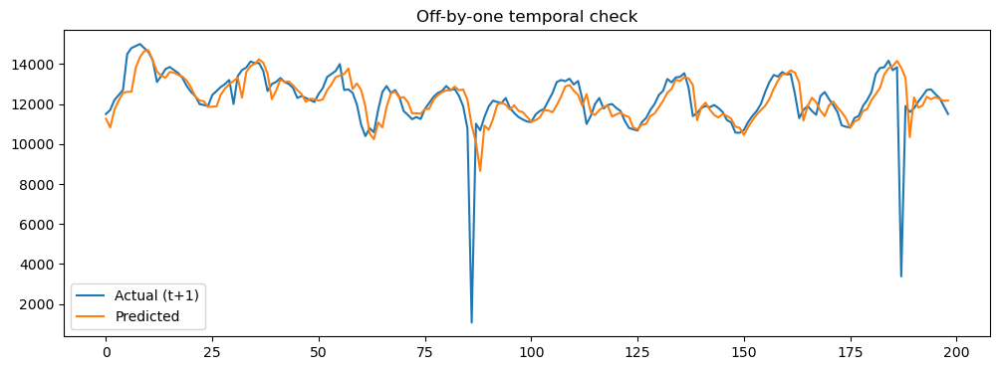

In [25]:
plt.figure(figsize=(12,4))
plt.plot(y_test_original[1:200], label='Actual (t+1)')
plt.plot(y_pred_original[:199], label='Predicted')
plt.legend()
plt.title('Off-by-one temporal check')
plt.show()



✓ Training history loaded from: ./model/training_history.pkl


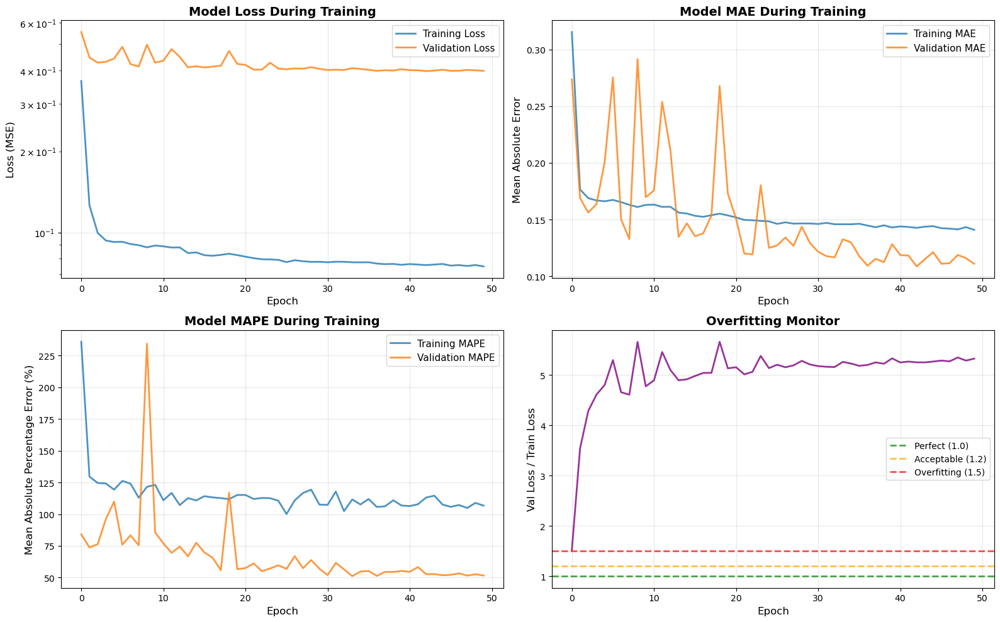


✓ Training history visualization completed


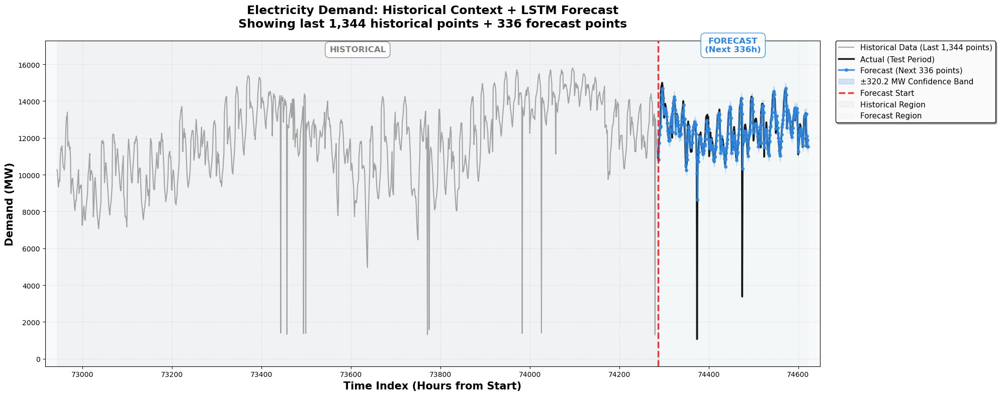

✓ Dynamic visualization with SHOW_LAST_DATA = 4
  Historical data: 1,344 points (last 4×336)
  Forecast: 336 points
  Transition at index: 74,287
  Total shown: 1,680 points


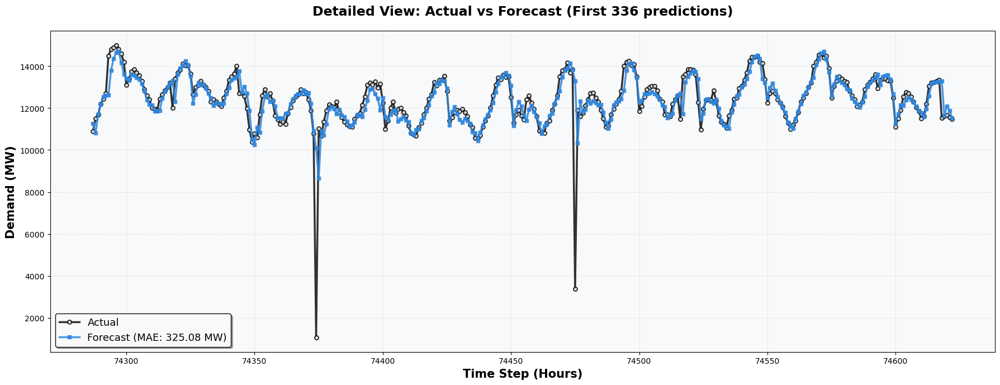

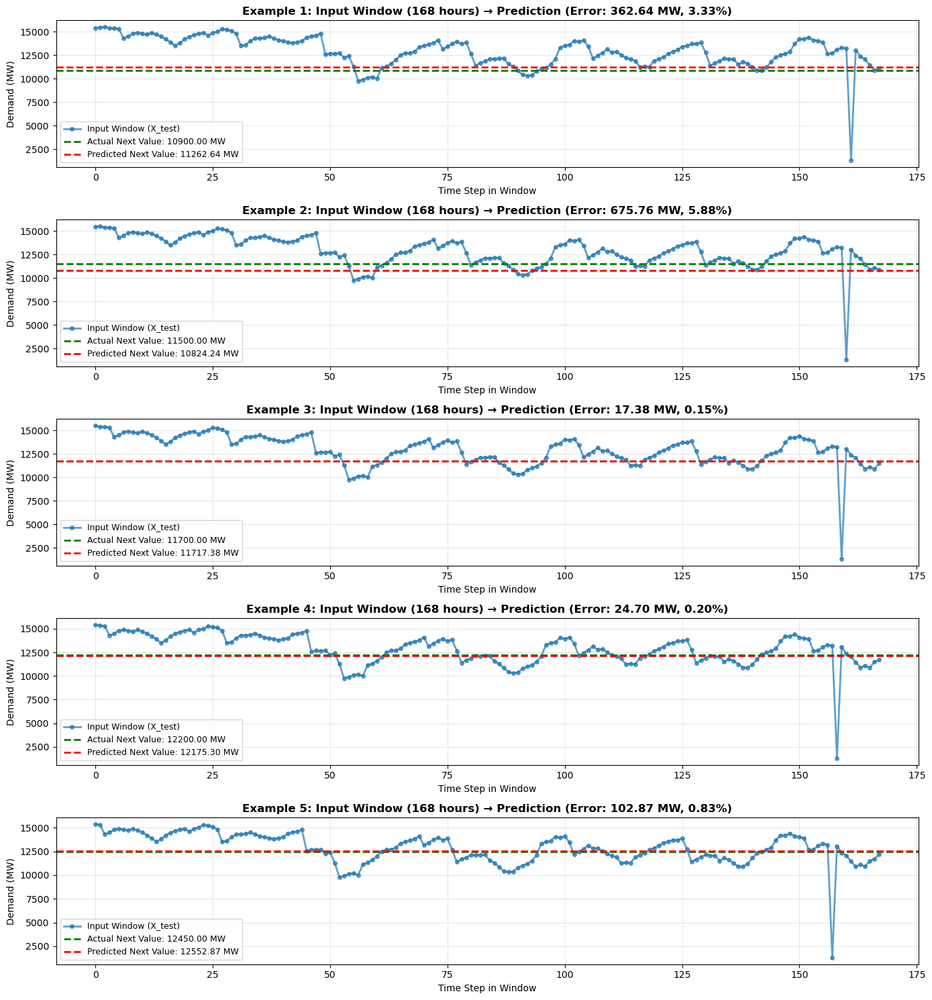


✓ All visualizations completed!


In [26]:
# ============================================================================
# BLOCK 10: PLOT TRAINING HISTORY WITH INSIGHTS
# ============================================================================

# Load training history if it exists
history_path = os.path.join(os.path.dirname(MODEL_PATH), 'training_history.pkl')
if os.path.exists(history_path):
    import pickle
    with open(history_path, 'rb') as f:
        history = pickle.load(f)
    print(f"✓ Training history loaded from: {history_path}")
else:
    print(f"⚠️  Training history not found at: {history_path}")
    print("  Using dummy history (plotting will be skipped)")
    history = None

if history is not None:
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))

    # Plot 1: Loss (log scale for better visibility)
    axes[0, 0].plot(history['loss'], label='Training Loss', linewidth=2, alpha=0.8)
    axes[0, 0].plot(history['val_loss'], label='Validation Loss', linewidth=2, alpha=0.8)
    axes[0, 0].set_xlabel('Epoch', fontsize=12)
    axes[0, 0].set_ylabel('Loss (MSE)', fontsize=12)
    axes[0, 0].set_title('Model Loss During Training', fontsize=14, fontweight='bold')
    axes[0, 0].legend(fontsize=11)
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].set_yscale('log')  # Log scale for better visibility

    # Plot 2: MAE
    axes[0, 1].plot(history['mae'], label='Training MAE', linewidth=2, alpha=0.8)
    axes[0, 1].plot(history['val_mae'], label='Validation MAE', linewidth=2, alpha=0.8)
    axes[0, 1].set_xlabel('Epoch', fontsize=12)
    axes[0, 1].set_ylabel('Mean Absolute Error', fontsize=12)
    axes[0, 1].set_title('Model MAE During Training', fontsize=14, fontweight='bold')
    axes[0, 1].legend(fontsize=11)
    axes[0, 1].grid(True, alpha=0.3)

    # Plot 3: MAPE (if available)
    if 'mape' in history:
        axes[1, 0].plot(history['mape'], label='Training MAPE', linewidth=2, alpha=0.8)
        axes[1, 0].plot(history['val_mape'], label='Validation MAPE', linewidth=2, alpha=0.8)
        axes[1, 0].set_xlabel('Epoch', fontsize=12)
        axes[1, 0].set_ylabel('Mean Absolute Percentage Error (%)', fontsize=12)
        axes[1, 0].set_title('Model MAPE During Training', fontsize=14, fontweight='bold')
        axes[1, 0].legend(fontsize=11)
        axes[1, 0].grid(True, alpha=0.3)
    else:
        axes[1, 0].text(0.5, 0.5, 'MAPE not available', 
                        ha='center', va='center', fontsize=14)
        axes[1, 0].axis('off')

    # Plot 4: Learning Rate (if available)
    if 'lr' in history:
        axes[1, 1].plot(history['lr'], label='Learning Rate', 
                        linewidth=2, alpha=0.8, color='orange')
        axes[1, 1].set_xlabel('Epoch', fontsize=12)
        axes[1, 1].set_ylabel('Learning Rate', fontsize=12)
        axes[1, 1].set_title('Learning Rate Schedule', fontsize=14, fontweight='bold')
        axes[1, 1].set_yscale('log')
        axes[1, 1].legend(fontsize=11)
        axes[1, 1].grid(True, alpha=0.3)
    else:
        # Plot overfitting analysis
        train_loss = np.array(history['loss'])
        val_loss = np.array(history['val_loss'])
        overfit_ratio = val_loss / train_loss
        
        axes[1, 1].plot(overfit_ratio, linewidth=2, alpha=0.8, color='purple')
        axes[1, 1].axhline(y=1.0, color='green', linestyle='--', 
                           linewidth=2, label='Perfect (1.0)', alpha=0.7)
        axes[1, 1].axhline(y=1.2, color='orange', linestyle='--', 
                           linewidth=2, label='Acceptable (1.2)', alpha=0.7)
        axes[1, 1].axhline(y=1.5, color='red', linestyle='--', 
                           linewidth=2, label='Overfitting (1.5)', alpha=0.7)
        axes[1, 1].set_xlabel('Epoch', fontsize=12)
        axes[1, 1].set_ylabel('Val Loss / Train Loss', fontsize=12)
        axes[1, 1].set_title('Overfitting Monitor', fontsize=14, fontweight='bold')
        axes[1, 1].legend(fontsize=10)
        axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print("\n✓ Training history visualization completed")
else:
    print("⚠️  No training history available for plotting")

# ============================================================================
# BLOCK 11: DYNAMIC VISUALIZATION - HISTORICAL DATA + FORECAST
# ============================================================================
"""
Visualizes the transition from historical data to forecast.

Parameters:
- PREDICTION_POINTS: How many future points to forecast (already defined)
- SHOW_LAST_DATA: How many PREDICTION_POINTS to show as historical data before forecast
  Example: SHOW_LAST_DATA = 5 means show last 5×PREDICTION_POINTS historical points
"""

SHOW_LAST_DATA = 4  # Show last 5 forecast windows of historical data


train_size = len(X_train)
test_start_idx = train_size + SEQUENCE_LENGTH  # Where test predictions start

# Get original signal from wave_df (before scaling)
original_signal = wave_df['target'].values

# For time axis, create indices
time_indices = np.arange(len(original_signal))

# Calculate indices for predictions
pred_start_idx = test_start_idx
pred_end_idx = pred_start_idx + len(y_pred_original)

# Time indices for predictions
time_pred = time_indices[pred_start_idx:pred_end_idx]

# Limit visualization points if needed
n_points = min(PREDICTION_POINTS, len(y_pred_original))


# Get the full original unscaled data
original_signal = wave_df['target'].values  # Complete dataset in MW

# We need to find where the test predictions start in the original timeline
# Since we lost SEQUENCE_LENGTH points when creating sequences, and we split data
# The test predictions correspond to the END of the original signal

# Calculate total data points lost to sequences
total_samples = len(original_signal)
train_samples = len(X_train) + SEQUENCE_LENGTH  # Add back lost sequence points
test_samples = len(y_test_original)

# Test predictions start at the end minus test_samples
test_start_idx = total_samples - test_samples

# Calculate indices for visualization
historical_points = PREDICTION_POINTS * SHOW_LAST_DATA

# Ensure we have enough historical data
if test_start_idx < historical_points:
    historical_points = test_start_idx  # Use all available historical data
    print(f"⚠️  Warning: Not enough historical data for {SHOW_LAST_DATA} windows")
    print(f"   Showing available {historical_points} points instead")

# Start of historical window
hist_start_idx = test_start_idx - historical_points

# Indices for historical data
time_historical = np.arange(hist_start_idx, test_start_idx)

# Indices for forecast (continue from historical)
time_forecast = np.arange(test_start_idx, test_start_idx + min(PREDICTION_POINTS, len(y_pred_original)))

# Get the data
historical_data = original_signal[hist_start_idx:test_start_idx]
forecast_data = y_pred_original[:len(time_forecast)]

# Get actual values for the forecast period (for comparison)
actual_forecast = original_signal[test_start_idx:test_start_idx + len(time_forecast)]

# Create the visualization
fig, ax = plt.subplots(figsize=(20, 8))

# Plot HISTORICAL data (gray, thinner line)
ax.plot(time_historical, historical_data, 
        color='gray', linewidth=1.5, 
        label=f'Historical Data (Last {len(historical_data):,} points)', 
        alpha=0.7, zorder=1)

# Plot ACTUAL values for forecast period (black, thick line)
ax.plot(time_forecast, actual_forecast, 
        'k-', linewidth=2.5, 
        label='Actual (Test Period)', 
        alpha=0.9, zorder=2)

# Plot PREDICTIONS (blue with markers)
ax.plot(time_forecast, forecast_data, 
        color='#2E86DE', linewidth=2.5, marker='o', markersize=4,
        label=f'Forecast (Next {len(forecast_data):,} points)', 
        alpha=0.85, zorder=3)

# Add confidence band around predictions
ax.fill_between(time_forecast,
                forecast_data - mae,
                forecast_data + mae,
                alpha=0.2, color='#2E86DE', 
                label=f'±{mae:.1f} MW Confidence Band', 
                zorder=1)

# Mark the transition point (where forecast begins)
ax.axvline(x=test_start_idx, color='red', linestyle='--', 
           linewidth=2.5, alpha=0.8, zorder=4,
           label='Forecast Start')

# Add shaded regions
ax.axvspan(hist_start_idx, test_start_idx, 
           alpha=0.05, color='gray', zorder=0, 
           label='Historical Region')
ax.axvspan(test_start_idx, time_forecast[-1], 
           alpha=0.05, color='lightblue', zorder=0, 
           label='Forecast Region')

# Add text annotations
y_top = max(historical_data.max(), actual_forecast.max(), forecast_data.max())
y_top = y_top * 1.05  # Add 5% margin

# Historical region label
mid_hist = hist_start_idx + (test_start_idx - hist_start_idx) / 2
ax.text(mid_hist, y_top, 'HISTORICAL', 
        fontsize=12, color='gray', fontweight='bold',
        horizontalalignment='center', verticalalignment='bottom',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='white', 
                  edgecolor='gray', alpha=0.9))

# Forecast region label
mid_forecast = test_start_idx + (time_forecast[-1] - test_start_idx) / 2
ax.text(mid_forecast, y_top, f'FORECAST\n(Next {len(forecast_data):,}h)', 
        fontsize=12, color='#2E86DE', fontweight='bold',
        horizontalalignment='center', verticalalignment='bottom',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='white', 
                  edgecolor='#2E86DE', alpha=0.9))

# Improved styling
ax.set_xlabel('Time Index (Hours from Start)', fontsize=15, fontweight='bold')
ax.set_ylabel('Demand (MW)', fontsize=15, fontweight='bold')
ax.set_title(f'Electricity Demand: Historical Context + LSTM Forecast\n'
             f'Showing last {len(historical_data):,} historical points + {len(forecast_data):,} forecast points', 
             fontsize=17, fontweight='bold', pad=20)

# Better legend (outside plot if too crowded)
ax.legend(fontsize=11, loc='upper left', framealpha=0.95, 
          edgecolor='black', fancybox=True, shadow=True,
          bbox_to_anchor=(1.02, 1), borderaxespad=0.)

# Enhanced grid
ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.7)
ax.set_facecolor('#f8f9fa')

# Set limits
ax.set_xlim(hist_start_idx - (test_start_idx - hist_start_idx) * 0.02, 
            time_forecast[-1] + (test_start_idx - hist_start_idx) * 0.02)

y_min = min(historical_data.min(), actual_forecast.min(), forecast_data.min())
y_max = max(historical_data.max(), actual_forecast.max(), forecast_data.max())
y_margin = (y_max - y_min) * 0.1
ax.set_ylim(y_min - y_margin, y_max + y_margin)

plt.tight_layout()
plt.show()

print(f"✓ Dynamic visualization with SHOW_LAST_DATA = {SHOW_LAST_DATA}")
print(f"  Historical data: {len(historical_data):,} points (last {SHOW_LAST_DATA}×{PREDICTION_POINTS})")
print(f"  Forecast: {len(forecast_data):,} points")
print(f"  Transition at index: {test_start_idx:,}")
print(f"  Total shown: {len(historical_data) + len(forecast_data):,} points")


# ============================================================================
# BLOCK 12: DETAILED COMPARISON - ACTUAL vs FORECAST (ZOOMED)
# ============================================================================
# Show a closer view of the prediction region

fig, ax = plt.subplots(figsize=(18, 7))

# Focus only on the test/prediction region
#display_points = min(150, n_points)  # Show up to 150 points for clarity
# Use PREDICTION_POINTS to control how many predicted points to display (cap at available n_points)
errors = y_test_original - y_pred_original
abs_errors = np.abs(errors)
n_points = min(PREDICTION_POINTS, len(y_pred_original))
display_points = min(PREDICTION_POINTS, n_points)
# ...

# Plot actual values
ax.plot(time_pred[:display_points], y_test_original[:display_points], 
        'ko-', linewidth=2.5, markersize=5, label='Actual', 
        alpha=0.8, zorder=2, markerfacecolor='white', markeredgewidth=1.5)

# Plot predictions
ax.plot(time_pred[:display_points], y_pred_original[:display_points], 
        color='#2E86DE', linewidth=2.5, marker='s', markersize=4,
        label='Forecast', alpha=0.85, zorder=3, markerfacecolor='#2E86DE')

# Add error bars showing prediction accuracy
errors = np.abs(y_test_original[:display_points] - y_pred_original[:display_points])
for i in range(0, display_points, 5):  # Show every 5th error bar to avoid clutter
    ax.plot([time_pred[i], time_pred[i]], 
            [y_test_original[i], y_pred_original[i]], 
            'r-', alpha=0.3, linewidth=1, zorder=1)

# Styling
ax.set_xlabel('Time Step (Hours)', fontsize=15, fontweight='bold')
ax.set_ylabel('Demand (MW)', fontsize=15, fontweight='bold')
ax.set_title(f'Detailed View: Actual vs Forecast (First {display_points} predictions)', 
             fontsize=17, fontweight='bold', pad=20)

# Legend with performance metric
mae_display = mean_absolute_error(y_test_original[:display_points], y_pred_original[:display_points])
legend_labels = [f'Actual', f'Forecast (MAE: {mae_display:.2f} MW)']
handles, _ = ax.get_legend_handles_labels()
ax.legend(handles, legend_labels, fontsize=13, loc='best', 
          framealpha=0.95, edgecolor='black', fancybox=True, shadow=True)

ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.7)
ax.set_facecolor('#f8f9fa')

plt.tight_layout()
plt.show()


# ============================================================================
# BLOCK 13: VISUALIZE INPUT WINDOWS (X_test)
# ============================================================================
# Show a few example input sequences and their predictions
n_examples = 5  # Number of windows to show

fig, axes = plt.subplots(n_examples, 1, figsize=(14, 3*n_examples))

for i in range(n_examples):
    if i >= len(X_test_seq):
        break
    
    # Get the input sequence (window)
    window = X_test_seq[i]  # Shape: (SEQUENCE_LENGTH, n_features)
    
    # Since we have 1 feature (signal), extract it
    window_values = window[:, 0]  # Get the signal feature values
    
    # Inverse transform window to original scale
    if SCALE_DATA and scaler is not None:
        window_original = scaler.inverse_transform(window_values.reshape(-1, 1)).flatten()
    else:
        window_original = window_values
    
    # Get actual and predicted values (already in original scale)
    actual = y_test_original[i]
    predicted = y_pred_original[i]
    
    # Plot the window
    axes[i].plot(range(SEQUENCE_LENGTH), window_original, 'o-', 
                linewidth=2, markersize=4, label='Input Window (X_test)', alpha=0.7)
    
    # Mark the prediction point
    axes[i].axhline(y=actual, color='green', linestyle='--', 
                   linewidth=2, label=f'Actual Next Value: {actual:.2f} MW')
    axes[i].axhline(y=predicted, color='red', linestyle='--', 
                   linewidth=2, label=f'Predicted Next Value: {predicted:.2f} MW')
    
    # Calculate error
    error = abs(actual - predicted)
    error_pct = (error / actual) * 100
    
    axes[i].set_xlabel('Time Step in Window', fontsize=10)
    axes[i].set_ylabel('Demand (MW)', fontsize=10)
    axes[i].set_title(f'Example {i+1}: Input Window ({SEQUENCE_LENGTH} hours) → Prediction (Error: {error:.2f} MW, {error_pct:.2f}%)', 
                     fontsize=12, fontweight='bold')
    axes[i].legend(fontsize=9, loc='best')
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✓ All visualizations completed!")


## Error Analysis

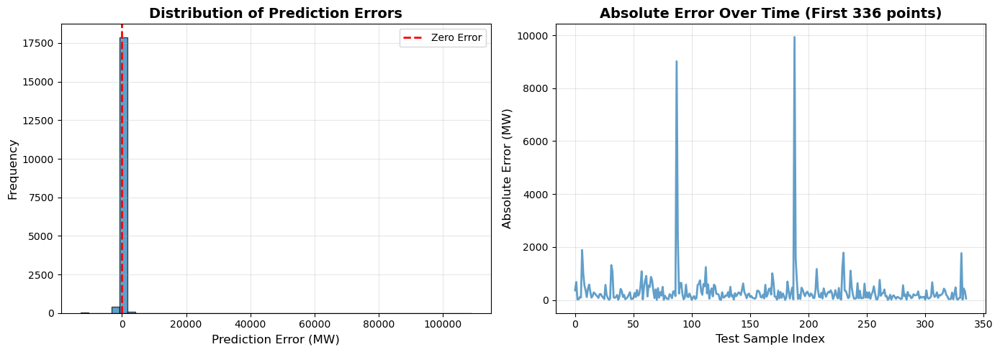


WORKFLOW COMPLETED SUCCESSFULLY! 🎉

Next steps:
1. Analyze the MAPE and prediction accuracy
2. If MAPE > 10%, try increasing SEQUENCE_LENGTH to 336 (2 weeks)
3. Consider adding external features (temperature, holidays, day of week)
4. Experiment with different architectures (more layers, units)
5. Check for outliers or anomalies in the error distribution


In [27]:
# ============================================================================
# BLOCK 14: ERROR ANALYSIS (CORRECT SCALE)
# ============================================================================

# Calculate prediction errors in ORIGINAL MW SCALE
errors = y_test_original - y_pred_original
abs_errors = np.abs(errors)

# Limit number of points for visualization
n_points = min(PREDICTION_POINTS, len(y_pred_original))

plt.figure(figsize=(14, 5))

# -------------------------------
# Error distribution
# -------------------------------
plt.subplot(1, 2, 1)
plt.hist(errors, bins=50, edgecolor='black', alpha=0.7)
plt.xlabel('Prediction Error (MW)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Distribution of Prediction Errors', fontsize=14, fontweight='bold')
plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero Error')
plt.legend()
plt.grid(True, alpha=0.3)

# -------------------------------
# Absolute error over time
# -------------------------------
plt.subplot(1, 2, 2)
plt.plot(abs_errors[:n_points], linewidth=2, alpha=0.7)
plt.xlabel('Test Sample Index', fontsize=12)
plt.ylabel('Absolute Error (MW)', fontsize=12)
plt.title(f'Absolute Error Over Time (First {n_points} points)', 
          fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


print("\n" + "="*70)
print("WORKFLOW COMPLETED SUCCESSFULLY! 🎉")
print("="*70)
print("\nNext steps:")
print("1. Analyze the MAPE and prediction accuracy")
print("2. If MAPE > 10%, try increasing SEQUENCE_LENGTH to 336 (2 weeks)")
print("3. Consider adding external features (temperature, holidays, day of week)")
print("4. Experiment with different architectures (more layers, units)")
print("5. Check for outliers or anomalies in the error distribution")
print("="*70)